In [4]:
import numpy as np

# Importing standard Qiskit libraries
from qiskit import QuantumCircuit, transpile, Aer, IBMQ
from qiskit.tools.jupyter import *
from qiskit.visualization import *
from ibm_quantum_widgets import *
from qiskit.providers.aer import QasmSimulator



In [5]:
import numpy as np
import pandas as pd
import copy
import seaborn as sns
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.axes as axes
import time

from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.cluster import SpectralClustering
from sklearn.metrics import normalized_mutual_info_score
from qiskit import BasicAer
from qiskit.utils import QuantumInstance
from qiskit.algorithms import VQE, QAOA, NumPyMinimumEigensolver
from qiskit.utils.algorithm_globals import algorithm_globals
from qiskit.optimization.applications.ising import max_cut
from qiskit.circuit.library import ZZFeatureMap
from qiskit.utils import QuantumInstance, algorithm_globals
#from qiskit_machine_learning.algorithms import QSVC
#from qiskit_machine_learning.kernels import QuantumKernel

from qiskit_optimization.applications import Maxcut, Tsp
from qiskit_optimization.algorithms import MinimumEigenOptimizer, CplexOptimizer, GurobiOptimizer
from qiskit_optimization import QuadraticProgram
from qiskit_optimization.problems.variable import VarType
from qiskit_optimization.converters.quadratic_program_to_qubo import QuadraticProgramToQubo
from qiskit_optimization.converters import QuadraticProgramToQubo
from qiskit_optimization.translators import from_docplex_mp

from qiskit_optimization.applications.graph_optimization_application import GraphOptimizationApplication
from qiskit.providers.ibmq.runtime import UserMessenger, ProgramBackend
from qiskit.algorithms.optimizers import SPSA, COBYLA,SLSQP
from qiskit.optimization.applications.ising import graph_partition
from qiskit.optimization.applications.ising.common import random_graph, sample_most_likely
from qiskit.circuit.library import TwoLocal

from qiskit_optimization.runtime import QAOAProgram, VQEProgram
from qiskit.providers.ibmq.runtime import UserMessenger, ProgramBackend
import random

/opt/conda/lib/python3.8/site-packages/qiskit/aqua/__init__.py:86: DeprecationWarning: The package qiskit.aqua is deprecated. It was moved/refactored to qiskit-terra For more information see <https://github.com/Qiskit/qiskit-aqua/blob/main/README.md#migration-guide>
  warn_package('aqua', 'qiskit-terra')
/opt/conda/lib/python3.8/site-packages/qiskit/optimization/__init__.py:92: DeprecationWarning: The package qiskit.optimization is deprecated. It was moved/refactored to qiskit_optimization (pip install qiskit-optimization). For more information see <https://github.com/Qiskit/qiskit-aqua/blob/main/README.md#migration-guide>
  warn_package('optimization', 'qiskit_optimization', 'qiskit-optimization')


In [6]:
%matplotlib inline
# Importing standard Qiskit libraries
from qiskit import QuantumCircuit, execute, Aer, IBMQ
from qiskit.compiler import transpile, assemble
from qiskit.tools.jupyter import *
from qiskit.visualization import *
from ibm_quantum_widgets import *
from qiskit.tools.visualization import circuit_drawer


In [7]:
n = 20
num_qubits = n**2
rng = np.random.default_rng()
seed = int(rng.random()*100)
seed

77

In [32]:

pip install qiskit-optimization[gurobi]

Note: you may need to restart the kernel to use updated packages.


In [8]:
from qiskit import IBMQ

In [9]:
IBMQ.load_account()

ibmqfactory.load_account:WARNING:2021-12-03 00:23:27,645: Credentials are already in use. The existing account in the session will be replaced.


<AccountProvider for IBMQ(hub='ibm-q', group='open', project='main')>

In [10]:
from qiskit.providers.ibmq import least_busy

In [11]:
backend = provider.get_backend('ibmq_qasm_simulator')


In [12]:
runtime_backends = provider.backends(input_allowed='runtime')

In [13]:
runtime_backends = provider.backends(input_allowed='runtime')
runtime_backends

[<IBMQSimulator('ibmq_qasm_simulator') from IBMQ(hub='ibm-q', group='open', project='main')>,
 <IBMQBackend('ibmq_armonk') from IBMQ(hub='ibm-q', group='open', project='main')>,
 <IBMQBackend('ibmq_santiago') from IBMQ(hub='ibm-q', group='open', project='main')>,
 <IBMQBackend('ibmq_bogota') from IBMQ(hub='ibm-q', group='open', project='main')>,
 <IBMQBackend('ibmq_lima') from IBMQ(hub='ibm-q', group='open', project='main')>,
 <IBMQBackend('ibmq_belem') from IBMQ(hub='ibm-q', group='open', project='main')>,
 <IBMQBackend('ibmq_quito') from IBMQ(hub='ibm-q', group='open', project='main')>,
 <IBMQSimulator('simulator_statevector') from IBMQ(hub='ibm-q', group='open', project='main')>,
 <IBMQSimulator('simulator_mps') from IBMQ(hub='ibm-q', group='open', project='main')>,
 <IBMQSimulator('simulator_extended_stabilizer') from IBMQ(hub='ibm-q', group='open', project='main')>,
 <IBMQSimulator('simulator_stabilizer') from IBMQ(hub='ibm-q', group='open', project='main')>,
 <IBMQBackend('ibmq_m

In [13]:
from qiskit.providers.ibmq import least_busy
devbus = least_busy(provider.backends(filters=lambda x: x.configuration().n_qubits >= 3 and 
                                   not x.configuration().simulator and x.status().operational==True))
devbus

<IBMQBackend('ibmq_lima') from IBMQ(hub='ibm-q', group='open', project='main')>

In [ ]:
!curl https://quantumexperience.ng.bluemix.net/api

/bin/bash: curl: command not found


In [ ]:
import pandas as pd
data = pd.read_csv('data1.csv')
data

,Output (S),Ia,Ib,Ic,Va,Vb,Vc
0,1,597.691323,-862.099743,266.480021,-0.014403,-0.027279,0.041683
1,0,47.375574,32.058836,-82.714287,-0.176042,0.607052,-0.431010
2,0,55.318270,2.254884,-55.314559,-0.038728,0.548725,-0.509997
3,1,52.577593,-608.730984,558.656914,0.168293,0.028713,-0.197006
4,1,-718.229625,-5.411836,723.938000,0.001335,0.027046,-0.028381
...,...,...,...,...,...,...,...
95,0,-70.548647,74.132478,-6.692754,-0.251565,-0.343879,0.595444
96,1,-65.382822,617.439503,-549.641020,-0.175263,-0.028682,0.203944
97,1,452.496295,-883.730429,431.231873,-0.022190,-0.020132,0.042322
98,0,-51.982083,13.388466,40.415309,0.299736,-0.590412,0.290677


In [25]:
datatest = data.loc[[9,26,45,52,75]]

In [26]:
datatest

,Output (S),Ia,Ib,Ic,Va,Vb,Vc
9,1,861.141208,42.158707,11.415650,0.015572,-0.315928,0.300356
26,0,-24.347061,-41.656897,62.251303,0.516673,-0.531343,0.014669
45,0,59.839266,-20.847615,-41.339557,0.015407,0.516222,-0.531630
52,1,356.087663,512.762978,56.778582,0.042295,-0.334681,0.292386
75,1,429.388080,442.005736,55.518410,0.042358,-0.349438,0.307080


In [27]:
datatest

,Output (S),Ia,Ib,Ic,Va,Vb,Vc
9,1,861.141208,42.158707,11.415650,0.015572,-0.315928,0.300356
26,0,-24.347061,-41.656897,62.251303,0.516673,-0.531343,0.014669
45,0,59.839266,-20.847615,-41.339557,0.015407,0.516222,-0.531630
52,1,356.087663,512.762978,56.778582,0.042295,-0.334681,0.292386
75,1,429.388080,442.005736,55.518410,0.042358,-0.349438,0.307080


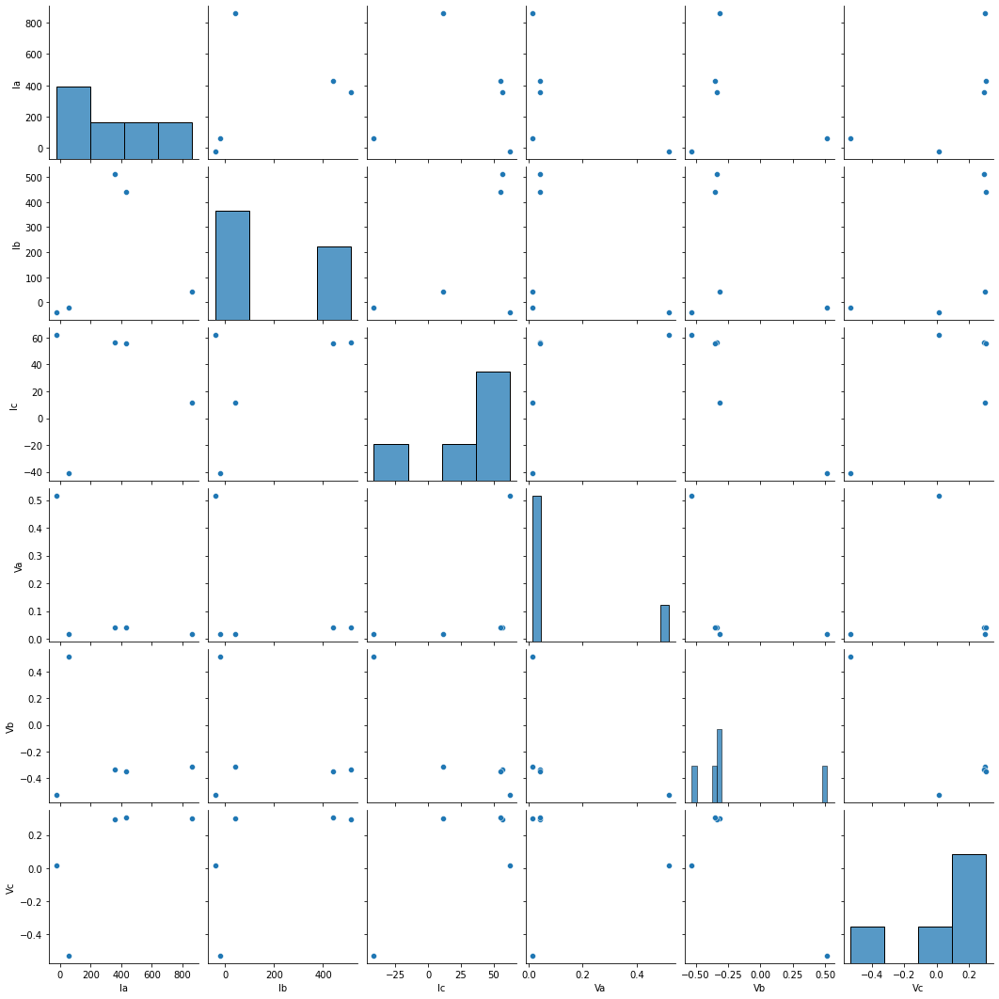

In [28]:
sns.pairplot(data=datatest, palette="Output (S)", vars=["Ia", "Ib", "Ic","Va","Vb","Vc"])
plt.show()

In [29]:
data = datatest.loc[:,['Ia','Ib','Ic']]

# Get number of data entries
n_instances = len(data)

# Convert dataframe into array
data_array = data.values

# Calculate pairwise L2-norms
w = np.zeros((n_instances, n_instances))
for i in range(0,n_instances):
    for j in range(0,n_instances):
        w[i, j] = np.linalg.norm(data_array[i]-data_array[j])

print('Weight matrix size:',w.shape)
print(w)

Weight matrix size: (5, 5)
[[  0.         890.89774576 805.50463164 691.81302335 590.11309396]
 [890.89774576   0.         135.09785328 672.4149957  663.21222209]
 [805.50463164 135.09785328   0.         618.167086   600.15082756]
 [691.81302335 672.4149957  618.167086     0.         101.8878134 ]
 [590.11309396 663.21222209 600.15082756 101.8878134    0.        ]]


In [30]:
max_cut = Maxcut(w)
qp = max_cut.to_quadratic_program()
print(qp.export_as_lp_string())

\ This file has been generated by DOcplex
\ ENCODING=ISO-8859-1
\Problem name: Max-cut

Maximize
 obj: 2978.328494703913 x_0 + 2361.622816824273 x_1 + 2158.920398474660 x_2
      + 2084.282918446263 x_3 + 1955.363957012401 x_4 + [
      - 3563.590983030479 x_0*x_1 - 3222.018526545813 x_0*x_2
      - 2767.252093399210 x_0*x_3 - 2360.452375840147 x_0*x_4
      - 540.391413101455 x_1*x_2 - 2689.659982804116 x_1*x_3
      - 2652.848888361040 x_1*x_4 - 2472.668343992341 x_2*x_3
      - 2400.603310259031 x_2*x_4 - 407.551253589385 x_3*x_4 ]/2
Subject To

Bounds
 0 <= x_0 <= 1
 0 <= x_1 <= 1
 0 <= x_2 <= 1
 0 <= x_3 <= 1
 0 <= x_4 <= 1

Binaries
 x_0 x_1 x_2 x_3 x_4
End



In [31]:
qp2qubo = QuadraticProgramToQubo()
qubo = qp2qubo.convert(qp)

qubitOp, offset = qp.to_ising()
print('Offset:', offset)
print('Ising Hamiltonian:')
print(str(qubitOp))


Offset: -2884.6296463653775
Ising Hamiltonian:
50.943906698673146 * ZZIII
+ 300.07541378237886 * ZIZII
+ 309.0835429990426 * IZZII
+ 331.60611104513004 * ZIIZI
+ 336.2074978505145 * IZIZI
+ 67.54892663768187 * IIZZI
+ 295.0565469800184 * ZIIIZ
+ 345.9065116749013 * IZIIZ
+ 402.75231581822663 * IIZIZ
+ 445.44887287880994 * IIIZZ


In [32]:
def relax_problem(problem) -> QuadraticProgram:
    """Change all variables to continuous."""
    relaxed_problem = copy.deepcopy(problem)
    for variable in relaxed_problem.variables:
        variable.vartype = VarType.CONTINUOUS
    return relaxed_problem

qp_relaxed = relax_problem(qubo)
qp_relaxed

\ This file has been generated by DOcplex
\ ENCODING=ISO-8859-1
\Problem name: Max-cut

Minimize
 obj: - 2978.328494703913 x_0 - 2361.622816824273 x_1 - 2158.920398474660 x_2
      - 2084.282918446263 x_3 - 1955.363957012401 x_4 + [
      3563.590983030479 x_0*x_1 + 3222.018526545813 x_0*x_2
      + 2767.252093399210 x_0*x_3 + 2360.452375840147 x_0*x_4
      + 540.391413101455 x_1*x_2 + 2689.659982804116 x_1*x_3
      + 2652.848888361040 x_1*x_4 + 2472.668343992341 x_2*x_3
      + 2400.603310259031 x_2*x_4 + 407.551253589385 x_3*x_4 ]/2
Subject To

Bounds
       x_0 <= 1
       x_1 <= 1
       x_2 <= 1
       x_3 <= 1
       x_4 <= 1
End

In [33]:
from scipy import linalg as LA
def matrix_semidefinitive_test(weight_matrix):
    neg_count = 0
    sigma = np.matrix(weight_matrix)
    e_values, e_vecs = LA.eig(sigma)
    for value in e_values:
        if value < 0:
            neg_count += 1
    if neg_count > 0:
        return("Please use Guorbi solver for your warmstar run")
    else:
        return("Please use Cplex solver for your warmstar run")

In [34]:
matrix_semidefinitive_test(w)

'Please use Guorbi solver for your warmstar run'

In [27]:
from qiskit_optimization.algorithms import GurobiOptimizer


In [152]:
pip install Gurobipy


Note: you may need to restart the kernel to use updated packages.


In [29]:
pip install qiskit-optimization[gurobi]

  Using cached gurobipy-9.5.0-cp38-cp38-manylinux2014_x86_64.whl (11.4 MB)
Note: you may need to restart the kernel to use updated packages.


In [35]:
gurobi_sol = GurobiOptimizer().solve(qp_relaxed)

Restricted license - for non-production use only - expires 2023-10-25


In [36]:
gurobi_sol

optimal function value: -4250.347508748205
optimal value: [-0.  1.  1. -0.  0.]
status: SUCCESS

In [37]:
cstars = gurobi_sol.samples[0].x
print(cstars)


[-0.0, 1.0, 1.0, -0.0, 0.0]


In [38]:
from qiskit import QuantumCircuit
thetas = [2*np.arcsin(np.sqrt(star)) for star in cstars]
thetas

[-0.0, 3.141592653589793, 3.141592653589793, -0.0, 0.0]

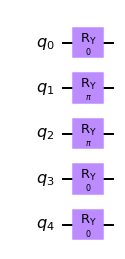

In [39]:
init_qc = QuantumCircuit(len(cstars))
for idx, theta in enumerate(thetas):
    init_qc.ry(theta, idx)
init_qc.draw(output='mpl')

/opt/conda/lib/python3.8/site-packages/sympy/core/expr.py:2451: SymPyDeprecationWarning: 

expr_free_symbols method has been deprecated since SymPy 1.9. See
https://github.com/sympy/sympy/issues/21494 for more info.

  SymPyDeprecationWarning(feature="expr_free_symbols method",


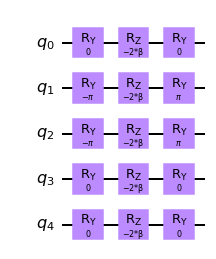

In [40]:
from qiskit.circuit import Parameter

beta = Parameter('β')

ws_mixer = QuantumCircuit(len(cstars))
for idx, theta in enumerate(thetas):
    ws_mixer.ry(-theta, idx)
    ws_mixer.rz(-2*beta, idx)
    ws_mixer.ry(theta, idx)
ws_mixer.draw(output='mpl')

In [41]:
backend = provider.get_backend('ibmq_qasm_simulator')
quantum_instance = QuantumInstance(backend,
                                   seed_simulator=seed,
                                   seed_transpiler=algorithm_globals.random_seed)

In [42]:
start_time = time.process_time()

ws_qaoa_mes = QAOA(quantum_instance=quantum_instance,
                   initial_state=init_qc,
                   mixer=ws_mixer,
                   initial_point=[0., 1.])

In [43]:
ws_qaoa_mes_result = ws_qaoa_mes.compute_minimum_eigenvalue(qubitOp)
x = max_cut.sample_most_likely(ws_qaoa_mes_result.eigenstate)
print('QAOA Warm start')
print('solution:', x)
print('time:', ws_qaoa_mes_result.optimizer_time)
print('Process time:', time.process_time() - start_time, "seconds")
print('energy:', ws_qaoa_mes_result.eigenvalue.real)
print('max-cut objective:', ws_qaoa_mes_result.eigenvalue.real + offset)
print('solution:', x)
print('solution objective:', qp.objective.evaluate(x))


QAOA Warm start
solution: [0 1 1 0 0]
time: 16.026273250579834
Process time: 0.541716580000001 seconds
energy: -1365.717862382828
max-cut objective: -4250.347508748206
solution: [0 1 1 0 0]
solution objective: 4250.347508748205


In [44]:
start_time = time.process_time()
normal_qaoa_mes = QAOA(quantum_instance=quantum_instance,initial_point=[0., 1.])

In [45]:
normal_qaoa_mes_result = normal_qaoa_mes.compute_minimum_eigenvalue(qubitOp)
x_normal = max_cut.sample_most_likely(normal_qaoa_mes_result.eigenstate)

print('QAOA Normal start')
print('solution:', x_normal)
print('time:', normal_qaoa_mes_result.optimizer_time)
print('Process time:', time.process_time() - start_time, "seconds")
print('energy:', normal_qaoa_mes_result.eigenvalue.real)
print('max-cut objective:', normal_qaoa_mes_result.eigenvalue.real + offset)
print('solution:', x_normal)
print('solution objective:', qp.objective.evaluate(x_normal))


QAOA Normal start
solution: [0 1 0 1 1]
time: 14.442968845367432
Process time: 0.4823975919999999 seconds
energy: 5.659398688001563
max-cut objective: -2878.970247677376
solution: [0 1 0 1 1]
solution objective: 3526.2396299056663


In [46]:
exact = MinimumEigenOptimizer(NumPyMinimumEigensolver())
result = exact.solve(qp)
print(result)

optimal function value: 4250.347508748206
optimal value: [1. 0. 0. 1. 1.]
status: SUCCESS


In [47]:
start_time = time.process_time() # solving Quadratic Program using exact classical eigensolver
#Making the Hamiltonian in its full form and getting the lowest eigenvalue and eigenvector
ee = NumPyMinimumEigensolver()
result_np = ee.compute_minimum_eigenvalue(qubitOp)

x_np = max_cut.sample_most_likely(result_np.eigenstate)
print('Classical NumPy Minimum Eigensolver')
print('energy:', result_np.eigenvalue.real)
print('Process time:', time.process_time() - start_time, "seconds")
print('max-cut objective:', result_np.eigenvalue.real + offset)
print('solution:', x_np)
print('solution objective:', qp.objective.evaluate(x_np))

Classical NumPy Minimum Eigensolver
energy: -1365.717862382828
Process time: 0.006523466000000866 seconds
max-cut objective: -4250.347508748206
solution: [1 0 0 1 1]
solution objective: 4250.347508748206


In [48]:
quantum_instance = QuantumInstance(backend, seed_simulator=seed, seed_transpiler=seed)

In [51]:
start_time = time.process_time() # solving Quadratic Program using exact classical eigensolver
# construct VQE
spsa = SPSA(maxiter=300)
ry = TwoLocal(qubitOp.num_qubits, 'ry', 'cz', reps=5, entanglement='linear')
vqe = VQE(ry, optimizer=spsa, quantum_instance=quantum_instance)

# run VQE
result_vqe = vqe.compute_minimum_eigenvalue(qubitOp)

# print results
x_vqe = max_cut.sample_most_likely(result_vqe.eigenstate)
print('energy:', result_vqe.eigenvalue.real)
print('time:', result_vqe.optimizer_time)
print('Process time:', time.process_time() - start_time, "seconds")
print('max-cut objective:', result_vqe.eigenvalue.real + offset)
print('solution:', x_vqe)
print('solution objective:', qp.objective.evaluate(x_vqe))

energy: -1353.0691486036515
time: 2848.8414351940155
Process time: 65.097266419 seconds
max-cut objective: -4237.698794969029
solution: [0 1 1 0 0]
solution objective: 4250.347508748205


In [52]:
spsa = SPSA(maxiter=300)
start_time = time.process_time() # solving Quadratic Program using exact classical eigensolver
ansatz = TwoLocal(qubitOp.num_qubits, 'ry', 'cz', reps=3, entanglement='linear')

In [53]:
runtime_backends = provider.backends(input_allowed='runtime')
runtime_backends

[<IBMQSimulator('ibmq_qasm_simulator') from IBMQ(hub='ibm-q', group='open', project='main')>,
 <IBMQBackend('ibmq_armonk') from IBMQ(hub='ibm-q', group='open', project='main')>,
 <IBMQBackend('ibmq_santiago') from IBMQ(hub='ibm-q', group='open', project='main')>,
 <IBMQBackend('ibmq_bogota') from IBMQ(hub='ibm-q', group='open', project='main')>,
 <IBMQBackend('ibmq_lima') from IBMQ(hub='ibm-q', group='open', project='main')>,
 <IBMQBackend('ibmq_belem') from IBMQ(hub='ibm-q', group='open', project='main')>,
 <IBMQBackend('ibmq_quito') from IBMQ(hub='ibm-q', group='open', project='main')>,
 <IBMQSimulator('simulator_statevector') from IBMQ(hub='ibm-q', group='open', project='main')>,
 <IBMQSimulator('simulator_mps') from IBMQ(hub='ibm-q', group='open', project='main')>,
 <IBMQSimulator('simulator_extended_stabilizer') from IBMQ(hub='ibm-q', group='open', project='main')>,
 <IBMQSimulator('simulator_stabilizer') from IBMQ(hub='ibm-q', group='open', project='main')>,
 <IBMQBackend('ibmq_m

In [54]:
backend


<IBMQSimulator('ibmq_qasm_simulator') from IBMQ(hub='ibm-q', group='open', project='main')>

In [56]:
vqe_result_runtime = vqe_runtime.compute_minimum_eigenvalue(qubitOp)

In [57]:
vqe_eigenstate = list(vqe_result_runtime.eigenstate.values())
vqe_qubit = list(vqe_result_runtime.eigenstate.keys())
index = vqe_eigenstate.index(max(vqe_eigenstate))
print(vqe_qubit[index])

x_vqe_result_runtime = max_cut.sample_most_likely(vqe_result_runtime.eigenstate)
print('energy:', vqe_result_runtime.eigenvalue.real)
print('time:', vqe_result_runtime.optimizer_time)
print('Process time:', time.process_time() - start_time, "seconds")
print('max-cut objective:', vqe_result_runtime.eigenvalue.real + offset)
print('solution:', x_vqe_result_runtime)
print('solution objective:', qp.objective.evaluate(x_vqe_result_runtime))

01111
energy: -1365.452723875752
time: 101.37344408035278
Process time: 1.1254262820000065 seconds
max-cut objective: -4250.08237024113
solution: [1 1 1 1 0]
solution objective: 1955.3639570124014


In [58]:
print('energy:', vqe_result_runtime.eigenvalue.real)
x_2 = Maxcut.sample_most_likely(vqe_result_runtime.eigenstate)
#z_2 = Maxcut.interpret(x_2)
print(x_2)

energy: -1365.452723875752
[1 1 1 1 0]


In [59]:
start_time = time.process_time() # solving Quadratic Program using exact classical eigensolver
ws_qaoa_runtime = QAOAProgram(optimizer=optimizer,
                         initial_point=[0, 0],
                         reps=1,
                         provider=provider,
                         backend=backend,
                         shots=8192,
                         measurement_error_mitigation=True,
                         callback=callback,
                         store_intermediate=True,
                         mixer=ws_mixer,
                         initial_state=init_qc)
ws_qaoa_result_runtime = ws_qaoa_runtime.compute_minimum_eigenvalue(qubitOp)

In [60]:
x_ws_qaoa_result_runtime = max_cut.sample_most_likely(ws_qaoa_result_runtime.eigenstate)
print('energy:', ws_qaoa_result_runtime.eigenvalue.real)
print('time:', ws_qaoa_result_runtime.optimizer_time)
print('Process time:', time.process_time() - start_time, "seconds")
print('max-cut objective:', ws_qaoa_result_runtime.eigenvalue.real + offset)
print('solution:', x_ws_qaoa_result_runtime)
print('solution objective:', qp.objective.evaluate(x_ws_qaoa_result_runtime))

energy: -1365.717832119399
time: 104.41971564292908
Process time: 1.0527546570000084 seconds
max-cut objective: -4250.347478484777
solution: [0 1 1 0 0]
solution objective: 4250.347508748205


In [61]:
start_time = time.process_time() # solving Quadratic Program using exact classical eigensolver
qaoa_runtime = QAOAProgram(optimizer=optimizer,
                         initial_point=[0,0],
                         reps=1,
                         provider=provider,
                         backend=backend,
                         shots=8192,
                         measurement_error_mitigation=True,
                         callback=callback,
                         store_intermediate=True)

In [62]:
qaoa_result_runtime = qaoa_runtime.compute_minimum_eigenvalue(qubitOp)

x_qaoa_result_runtime = max_cut.sample_most_likely(qaoa_result_runtime.eigenstate)
print('energy:', qaoa_result_runtime.eigenvalue.real)
print('time:', qaoa_result_runtime.optimizer_time)
print('Process time:', time.process_time() - start_time, "seconds")
print('max-cut objective:', qaoa_result_runtime.eigenvalue.real + offset)
print('solution:', x_qaoa_result_runtime)
print('solution objective:', qp.objective.evaluate(x_qaoa_result_runtime))

energy: 88.14632104862278
time: 80.49871134757996
Process time: 0.8164326119999998 seconds
max-cut objective: -2796.483325316755
solution: [1 1 0 0 0]
solution objective: 3558.1558200129466


In [63]:
print('energy:', qaoa_result_runtime.eigenvalue.real)
x_3 = Maxcut.sample_most_likely(qaoa_result_runtime.eigenstate)
print(x_3)

energy: 88.14632104862278
[1 1 0 0 0]
